<a href="https://colab.research.google.com/github/nnkhang19/ZaloAI2021-HumToSong/blob/main/similarity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [14]:
!pip install essentia

ERROR: Could not find a version that satisfies the requirement acousticid (from versions: none)
ERROR: No matching distribution found for acousticid


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [32]:
import essentia
import essentia.standard as estd
import essentia.streaming
from essentia.pytools.spectral import hpcpgram

# Load data and visualize

In [4]:
filename = "/content/drive/MyDrive/ZaloAI2021-HumToSong/Data/Winterspell.mp3"
loader = essentia.standard.MonoLoader(filename=filename)
audio = loader()

In [5]:
from IPython.display import Audio, display
Audio(filename)

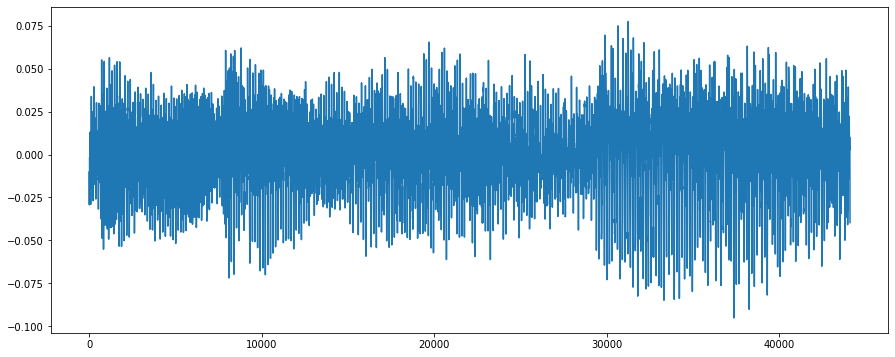

In [6]:
from pylab import plot, show, figure, imshow
import seaborn as sns
sns.set_style()
%matplotlib inline
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (15, 6)

plot(audio[1*44100:2*44100])
show()

In [16]:
fingerprint = essentia.standard.Chromaprinter()(audio)

In [17]:
fingerprint

'AQAGPYoWSckixWCMPke0E-KDijHiTEcJI78F8eiP_3jyQceRVj9-7GHwOBGP5NsRTvhRHP0Lq7kMzseP76g_BNJ1lGKOtkJ0HjGqtBzcHIf-wvfxQ8-Mnni-QCfRKwiT48eVzdjdoH5wZIdP9DjuHOWzwV30QHuDetNhHtmxH_4JhxyDNFnSBzqRHuWNG_9x5UeyX0HuZ-iHwzl-_DVyUWmQ5NLRDT144_yK_obVNsad4yvOHvWQH_oHhj5yBdONTokOv2PwA96FvvjR03iGPGdQM0MvNPlxPNmaYHehbd-DfCMF6uiP40EpJSTMH3nhHNqf4DzxI7_RH3aIklm0IPvxzDj05egR5vgFMtw6_McXEelLPAr0_chzXEevHf7RJ0X-QH2Qw3XwEJ941Cf8GNUf8DX-HDGlHOcxzQuc-qjNQjth_sc_nMiP2nnwvUHMafCN_SseCZc5osd35D_so0cOXUlG-DriHz_ad2iqMCp-5Dx-Q4tdFeGT49RDPM9xFZGuCSfOB-KU_CizxArxFLoo_GNwrpHx5EQTbhQ6PTv0R-iqD9sz-Ee_gpWbEHfxo83R_HiSILyKRsqINw-YI-2PYlcS6BGJizkuPM_RH76gZxKaMMWlFOmD_7iSHfOeBD2Fizh8Hr1w9cKnSMWjbCGOnkay8LGFkMrxHz6DEdYWI1Qf6OqR3yhJ7nikIxTtQU02hM2GZi_xBFeO5ui1YKaQp0dSPUVXXXiPnmTQHz_-Ev8BT0cfPsh34X-GB9MFnYHDTXDCKIZOS_CDv0KzQD-eo9aloP9wovkO7cePPMkxr0mPHvHxE76IXtmhf5AqPUW1ZRSew-rxBx-oJjqs4-xgJ1FwHnOeG26So7_wDZrkw8kRNlGU43pwxviFP0O-4ELTDOWRZ85wH_mP7gm-pqgkZYeeUkcuoZcc_EKfodZx5Xge3HDS7uiFPDt0JdEQkh_642R2HHXCcHhmHzczPEWY4zqe5CF-QdGR_uj

In [36]:
hum1 = estd.MonoLoader(filename="/content/drive/MyDrive/ZaloAI2021-HumToSong/Data/hum/0000.mp3", sampleRate=32768)()
hum2 = estd.MonoLoader(filename="/content/drive/MyDrive/ZaloAI2021-HumToSong/Data/hum/0001.mp3", sampleRate=32768)()
song1 = estd.MonoLoader(filename="/content/drive/MyDrive/ZaloAI2021-HumToSong/Data/song/0000.mp3", sampleRate=32768)()
song2 = estd.MonoLoader(filename="/content/drive/MyDrive/ZaloAI2021-HumToSong/Data/song/0001.mp3", sampleRate=32768)()

hpcp_hum1 = hpcpgram(hum1, sampleRate=32000)
hpcp_hum2 = hpcpgram(hum2, sampleRate=32000)
hpcp_song1 = hpcpgram(song1, sampleRate=32000)
hpcp_song2 = hpcpgram(song2, sampleRate=32000)

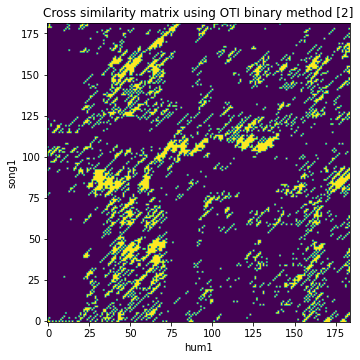

In [47]:
csm = estd.ChromaCrossSimilarity(frameStackSize=9,
                                 frameStackStride=1,
                                 binarizePercentile=0.095,
                                 oti=True,
                                 otiBinary=True)

oti_csm = csm(hpcp_hum1, hpcp_song1)

fig = plt.gcf()
fig.set_size_inches(15.5, 5.5)

plt.title('Cross similarity matrix using OTI binary method [2]')
plt.xlabel('hum1')
plt.ylabel('song1')
plt.imshow(oti_csm, origin='lower')

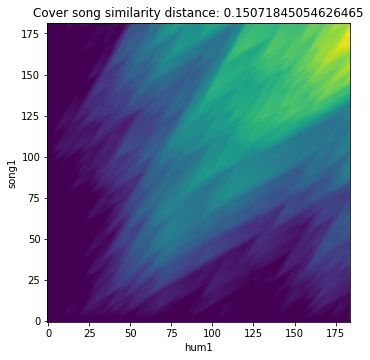

In [52]:
oti_csm = csm(hpcp_hum1, hpcp_song1)

score_matrix, distance = estd.CoverSongSimilarity(disOnset=0.5,
                                                  disExtension=0.5,
                                                  alignmentType='serra09',
                                                  distanceType='asymmetric')(oti_csm)

fig = plt.gcf()
fig.set_size_inches(15.5, 5.5)

plt.title('Cover song similarity distance: %s' % distance)
plt.xlabel('hum1')
plt.ylabel('song1')
plt.imshow(score_matrix, origin='lower')

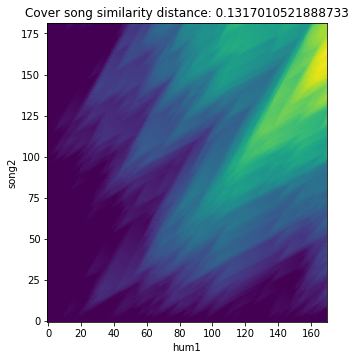

In [53]:
oti_csm = csm(hpcp_hum1, hpcp_song2)

score_matrix, distance = estd.CoverSongSimilarity(disOnset=0.5,
                                                  disExtension=0.5,
                                                  alignmentType='serra09',
                                                  distanceType='asymmetric')(oti_csm)

fig = plt.gcf()
fig.set_size_inches(15.5, 5.5)

plt.title('Cover song similarity distance: %s' % distance)
plt.xlabel('hum1')
plt.ylabel('song2')
plt.imshow(score_matrix, origin='lower')

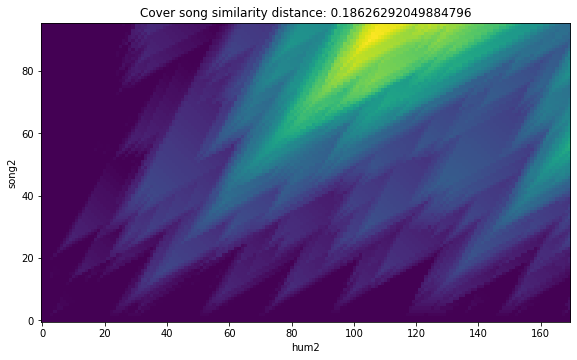

In [55]:
oti_csm = csm(hpcp_hum2, hpcp_song2)

score_matrix, distance = estd.CoverSongSimilarity(disOnset=0.5,
                                                  disExtension=0.5,
                                                  alignmentType='serra09',
                                                  distanceType='asymmetric')(oti_csm)

fig = plt.gcf()
fig.set_size_inches(15.5, 5.5)

plt.title('Cover song similarity distance: %s' % distance)
plt.xlabel('hum2')
plt.ylabel('song2')
plt.imshow(score_matrix, origin='lower')

In [7]:
from essentia.standard import *
w = Windowing(type = 'hann')
spectrum = Spectrum()
mfcc = MFCC()

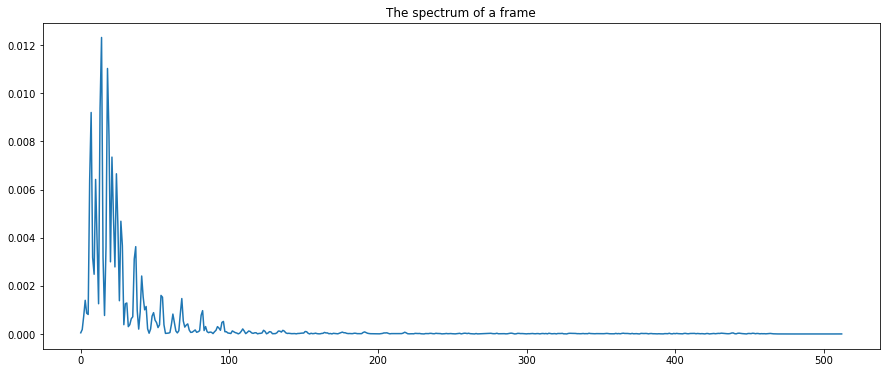

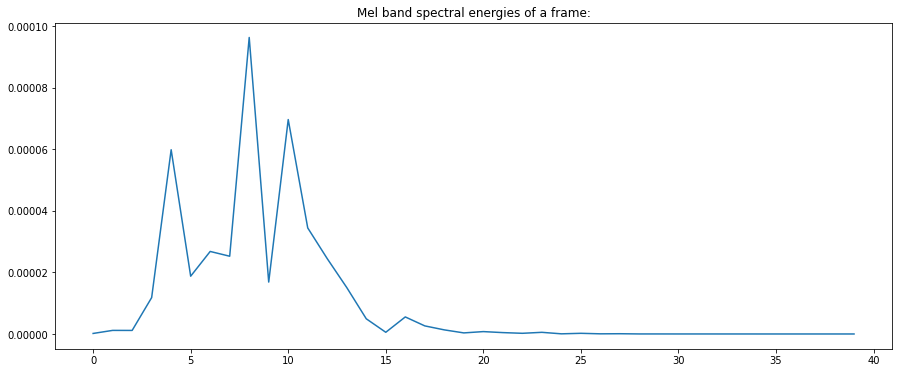

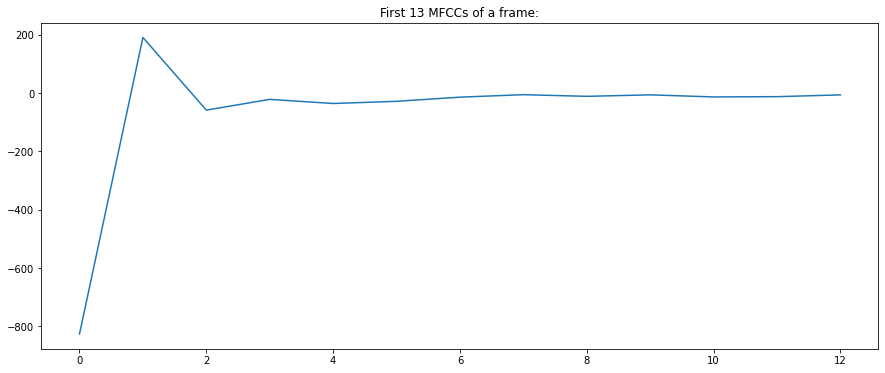

In [8]:
frame = audio[6*44100 : 6*44100 + 1024]
spec = spectrum(w(frame))
mfcc_bands, mfcc_coeffs = mfcc(spec)

plot(spec)
plt.title("The spectrum of a frame")
show()

plot(mfcc_bands)
plt.title("Mel band spectral energies of a frame:")
show()

plot(mfcc_coeffs)
plt.title("First 13 MFCCs of a frame:")
show()

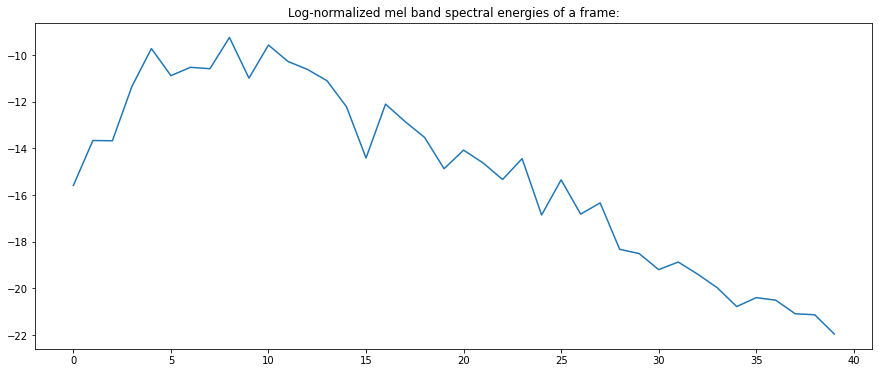

In [9]:
logNorm = UnaryOperator(type='log')
plot(logNorm(mfcc_bands))
plt.title("Log-normalized mel band spectral energies of a frame:")
show()

In [10]:
mfccs = []
melbands = []
frameSize = 1024
hopSize = 512

for fstart in range(0, len(audio)-frameSize, hopSize):
    frame = audio[fstart:fstart+frameSize]
    mfcc_bands, mfcc_coeffs = mfcc(spectrum(w(frame)))
    mfccs.append(mfcc_coeffs)
    melbands.append(mfcc_bands)

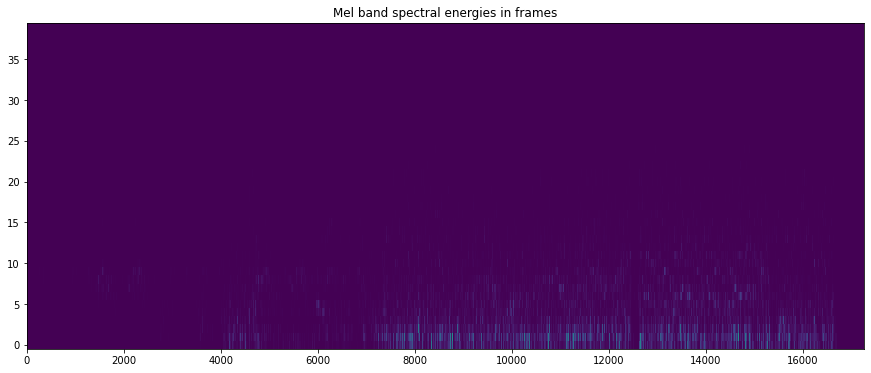

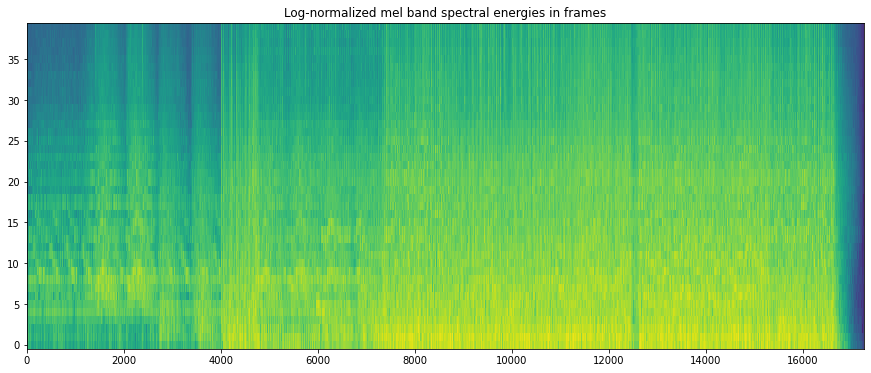

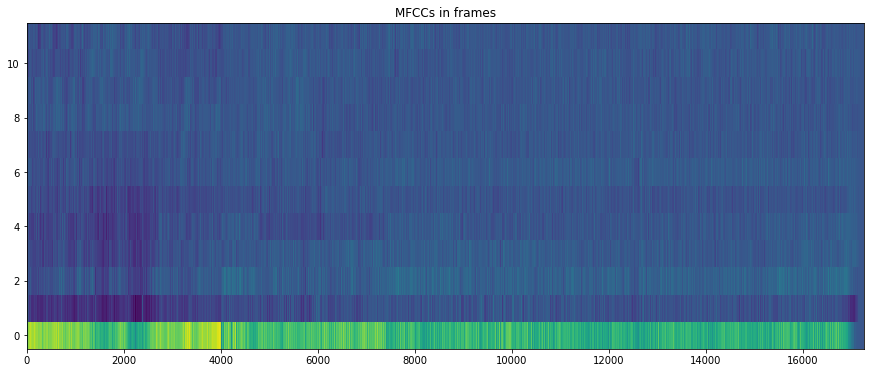

In [11]:
mfccs = []
melbands = []
melbands_log = []

for frame in FrameGenerator(audio, frameSize=1024, hopSize=512, startFromZero=True):
    mfcc_bands, mfcc_coeffs = mfcc(spectrum(w(frame)))
    mfccs.append(mfcc_coeffs)
    melbands.append(mfcc_bands)
    melbands_log.append(logNorm(mfcc_bands))

# transpose to have it in a better shape
# we need to convert the list to an essentia.array first (== numpy.array of floats)
mfccs = essentia.array(mfccs).T
melbands = essentia.array(melbands).T
melbands_log = essentia.array(melbands_log).T

# and plot
imshow(melbands[:,:], aspect = 'auto', origin='lower', interpolation='none')
plt.title("Mel band spectral energies in frames")
show()

imshow(melbands_log[:,:], aspect = 'auto', origin='lower', interpolation='none')
plt.title("Log-normalized mel band spectral energies in frames")
show()

imshow(mfccs[1:,:], aspect='auto', origin='lower', interpolation='none')
plt.title("MFCCs in frames")
show()

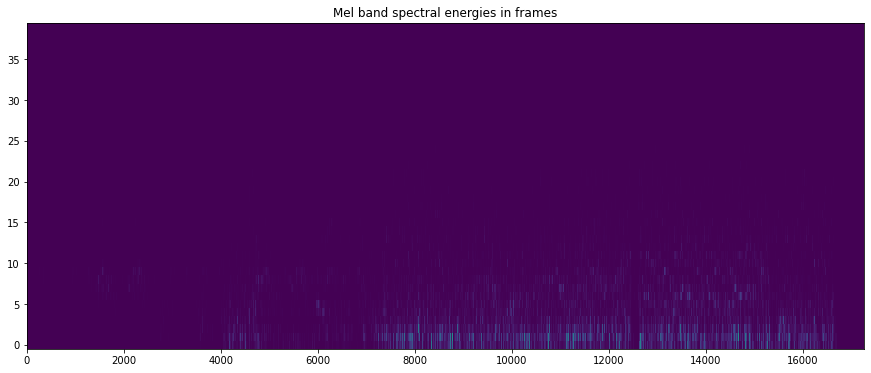

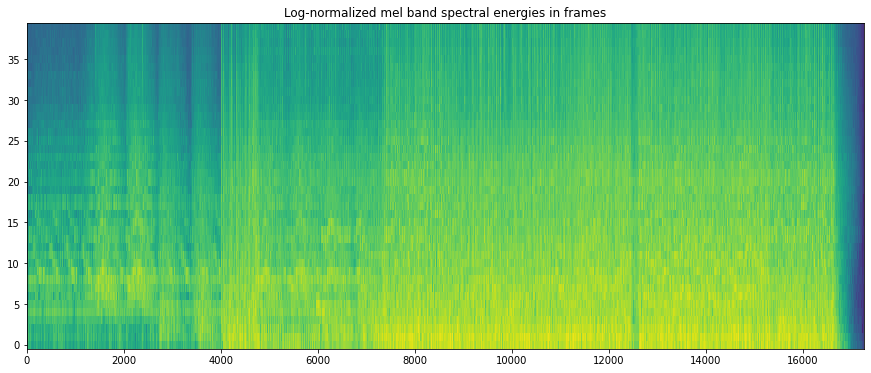

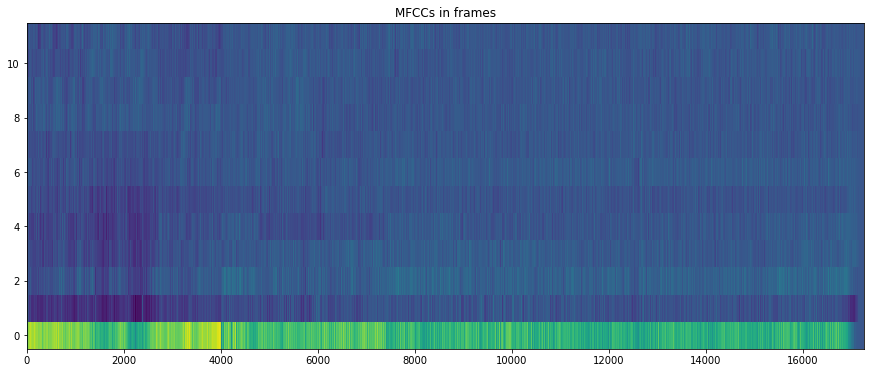

In [12]:
pool = essentia.Pool()

for frame in FrameGenerator(audio, frameSize = 1024, hopSize = 512, startFromZero=True):
    mfcc_bands, mfcc_coeffs = mfcc(spectrum(w(frame)))
    pool.add('lowlevel.mfcc', mfcc_coeffs)
    pool.add('lowlevel.mfcc_bands', mfcc_bands)
    pool.add('lowlevel.mfcc_bands_log', logNorm(mfcc_bands))

imshow(pool['lowlevel.mfcc_bands'].T, aspect = 'auto', origin='lower', interpolation='none')
plt.title("Mel band spectral energies in frames")
show()

imshow(pool['lowlevel.mfcc_bands_log'].T, aspect = 'auto', origin='lower', interpolation='none')
plt.title("Log-normalized mel band spectral energies in frames")
show()

imshow(pool['lowlevel.mfcc'].T[1:,:], aspect='auto', origin='lower', interpolation='none')
plt.title("MFCCs in frames")
show()

In [ ]:
output = YamlOutput(filename = 'mfcc.sig', format='json') # use "format = 'json'" for JSON output
output(pool)

# or as a one-liner:
YamlOutput(filename = 'mfcc.sig')(pool)

In [ ]:
# compute mean and variance of the frames
aggrPool = PoolAggregator(defaultStats = [ 'mean', 'stdev' ])(pool)

print('Original pool descriptor names:')
print(pool.descriptorNames())
print('')
print('Aggregated pool descriptor names:')
print(aggrPool.descriptorNames())
print('')

# and ouput those results in a file
YamlOutput(filename = 'mfccaggr.sig', format='json')(aggrPool)

Original pool descriptor names:
['lowlevel.mfcc', 'lowlevel.mfcc_bands', 'lowlevel.mfcc_bands_log']

Aggregated pool descriptor names:
['lowlevel.mfcc.mean', 'lowlevel.mfcc.stdev', 'lowlevel.mfcc_bands.mean', 'lowlevel.mfcc_bands.stdev', 'lowlevel.mfcc_bands_log.mean', 'lowlevel.mfcc_bands_log.stdev']

